In [1]:
import cv2
import numpy as np
from tqdm import tqdm
from lightglue import ALIKED, LightGlue
from lightglue.utils import load_image, rbd
import torch
import os
import h5py
from pathlib import Path
from time import perf_counter
from h5_to_db import export_to_colmap

torch.set_grad_enabled(False)

def extract_features(extractor, img_list):
    feats_list = []
    print('Feature extraction in progress..')
    for img in tqdm(img_list):
        # extract features
        feats = extractor.extract(img)
        # append to list
        feats_list.append(feats)
        torch.cuda.empty_cache()
        
    print('Feature extraction finished.')
    return feats_list

def make_seq_pairs(img_list, overlap):
    pairs = []
    for i in range(len(img_list) - overlap):
        for k in range(1, overlap + 1):
            pairs.append((i, i+k))
    return pairs

def apply_geometric_verification(kpts0, kpts1, matches):
    mkpts0 = kpts0[matches[:, 0]].cpu().numpy()
    mkpts1 = kpts1[matches[:, 1]].cpu().numpy()
    _, inlMask = geometric_verification(
        kpts0=mkpts0,
        kpts1=mkpts1
    )
    return matches[inlMask]

def geometric_verification(
        kpts0,
        kpts1,
        threshold = 4, # was 1
        confidence = 0.9999,
        max_iters = 10000
        ):
    """
    Computes the fundamental matrix and inliers between the two images using geometric verification.

    Args:
        threshold (float): Pixel error threshold for considering a correspondence an inlier.
        confidence (float): The required confidence level in the results.
        max_iters (int): The maximum number of iterations for estimating the fundamental matrix.
    """

    F = None
    inlMask = np.ones(len(kpts0), dtype=bool)
    if len(kpts0) < 4:
        #logger.warning("Not enough matches to perform geometric verification.")
        return F, inlMask
    try:
        F, inliers = cv2.findFundamentalMat(
            kpts0, kpts1, cv2.USAC_MAGSAC, threshold, confidence, max_iters
        )
        inlMask = (inliers > 0).squeeze()
        #logger.info(
        #    f"MAGSAC++ found {inlMask.sum()} inliers ({inlMask.sum()*100/len(kpts0):.2f}%)"
        #)
        print(f"MAGSAC++ found {inlMask.sum()} inliers ({inlMask.sum()*100/len(kpts0):.2f}%)")
    except Exception as err:
        #logger.error(
        #    f"{err}. Unable to perform geometric verification with MAGSAC++."
        #)
        print(f"{err}. Unable to perform geometric verification with MAGSAC++.")
        inlMask = np.ones(len(kpts0), dtype=bool)
    return F, inlMask
    


def match_imgs(matcher, pairs, feats):
    matches_cleaned = {}
    print('Matching in progress..')
    for pair in tqdm(pairs):
        print(f'Matching pair: {pair[0]}, {pair[1]}')
        feats0, feats1 = feats[pair[0]], feats[pair[1]]
        matches01 = matcher({'image0': feats0, 'image1': feats1})
        if matches01 is None:
            continue
        # remove batch dimension
        feats0, feats1, matches01 = [rbd(x) for x in [feats0, feats1, matches01]]
        matches_cleaned[pair] = matches01
        kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
        matches_cleaned[pair]['cleaned'] = apply_geometric_verification(kpts0, kpts1, matches)
        torch.cuda.empty_cache()
    print('Matching finished.')
    return matches_cleaned

def create_img_list(path_to_folder, device):
    print('Creating image list..')
    print('Reading folder..')
    img_paths = []
    for file in tqdm(sorted(os.listdir(path_to_folder))):
        filename = os.fsdecode(file)
        if filename.endswith('.jpg') or filename.endswith('.png'): 
            img_paths.append(Path(os.path.join(path_to_folder, filename)))
    print('Processing images..')
    img_list = []
    #device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # 'mps', 'cpu'
    for img_path in tqdm(img_paths):
        img = load_image(img_path)
        img = img.to(device)
        img_list.append(img)
    print('Image list created.')
    return img_list, img_paths

def features_to_file(feats, features_path, img_paths):
    for feat, img_path in zip(feats, img_paths):
        # remove batch dimension
        feat = rbd(feat)
        # Convert tensors to numpy arrays
        feat = {k: v.cpu().numpy() for k, v in feat.items()}
        # Transpose descriptors
        feat["descriptors"] = feat["descriptors"].T
        # Rename 'keypoint_scores' to 'scores'
        feat["scores"] = feat.pop("keypoint_scores")
        feat["feature_path"] = features_path
        feat["im_path"] = str(img_path)
        feat["tile_idx"] = np.zeros(
            feat["keypoints"].shape[0], dtype=np.float32
        )
        #feat["image_size"] = np.array(img.shape[:2])
        # If as_half is True then the features are converted to float32 or float16.
        for k in feat:
            if not isinstance(feat[k], np.ndarray):
                continue
            dt = feat[k].dtype
            if (dt == np.float32) and (dt != np.float16):
                feat[k] = feat[k].astype(np.float16)

        im_name = img_path.name
        with h5py.File(str(features_path), "a", libver="latest") as fd:
            if im_name in fd:
                del fd[im_name]
            grp = fd.create_group(im_name)
            for k, v in feat.items():
                if k == "im_path" or k == "feature_path":
                    grp.create_dataset(k, data=str(v))
                if isinstance(v, np.ndarray):
                    grp.create_dataset(k, data=v)

def matches_to_file(matches, matches_path, img_paths):
    if os.path.isfile(matches_path):
        os.remove(matches_path)
    for p, m in matches.items():
        match_res = {
            k: v.detach().cpu().numpy()
            for k, v in m.items()
            if isinstance(v, torch.Tensor)
        }
        match_res['matches'] = match_res['cleaned']
        del match_res['cleaned']
        # Save to h5 file
        img0_name = img_paths[p[0]].name
        img1_name = img_paths[p[1]].name
        with h5py.File(str(matches_path), "a", libver="latest") as fd:
            group = fd.require_group(img0_name)
            group.create_dataset(
                img1_name, data=match_res["matches"]
            )

def create_db(database_path, img_folder, features_path, matches_path):
    database_path = Path(database_path)
    #if os.path.isfile(database_path):
    #    os.remove(database_path)
    # Export in colmap format
    export_to_colmap(
        img_dir=img_folder,
        feature_path=features_path,
        match_path=matches_path,
        database_path=database_path,
        camera_model="simple-radial",
        single_camera=True,
    )


# create based on quality mode
def create_config(mode):
    config = {
        'extractor': {},
        'matcher': {}
    }
    if mode == "super-low":
        config['extractor']['max_num_keypoints'] = 1024
        config['matcher']['mp'] = True
        config['matcher']['depth_confidence'] = 0.9
        config['matcher']['width_confidence'] = 0.95
        config['matcher']['n_layers'] = 5
    elif mode == "low":
        config['extractor']['max_num_keypoints'] = 2048
        config['matcher']['mp'] = True
        config['matcher']['depth_confidence'] = 0.9
        config['matcher']['width_confidence'] = 0.95
        config['matcher']['n_layers'] = 5
    elif mode == "mid":
        config['extractor']['max_num_keypoints'] = 4096
        config['matcher']['mp'] = False
        config['matcher']['depth_confidence'] = 0.95
        config['matcher']['width_confidence'] = 0.99
        config['matcher']['n_layers'] = 7
    elif mode == "high":
        config['extractor']['max_num_keypoints'] = 8192
        config['matcher']['mp'] = False
        config['matcher']['depth_confidence'] = -1
        config['matcher']['width_confidence'] = -1
        config['matcher']['n_layers'] = 9
    return config


def process_extract_match(params, remove_temp):
    path_to_images = params['path_to_images']
    path_to_database = params['path_to_database']
    if params['use_gpu']:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # 'mps', 'cpu'
    else:
        device = torch.device("cpu")
    print(device)
    config = create_config(params['quality_mode'])
    # load extractor
    extractor = ALIKED(
        max_num_keypoints=config['extractor']['max_num_keypoints']
    ).eval().to(device)
    # load matcher
    matcher = LightGlue(
        features="aliked", 
        depth_confidence=config['matcher']['depth_confidence'], 
        width_confidence=config['matcher']['width_confidence'],
        n_layers=config['matcher']['n_layers']
    ).eval().to(device)
    if params['quality_mode'] == "super-low":
        matcher.compile(mode='reduce-overhead')
    with torch.no_grad():
        time_start = perf_counter() 
        img_list, img_paths = create_img_list(path_to_images, device)
        time_extract_start = perf_counter() 
        feats = extract_features(extractor, img_list)
        time_extract_end = perf_counter() 
        pairs = make_seq_pairs(img_list, 2)
        time_match_start = perf_counter() 
        matches = match_imgs(matcher, pairs, feats)
        time_match_end = perf_counter()
        features_path = 'features.h5'
        features_to_file(feats, features_path, img_paths)
        matches_path = 'matches.h5'
        matches_to_file(matches, matches_path, img_paths)
        create_db(path_to_database, path_to_images, features_path, matches_path)
        time_end = perf_counter()
        time_res = {
            'time': time_end - time_start,
            'extract': time_extract_end - time_extract_start,
            'match': time_match_end - time_match_start
        }
        time_res['util'] = time_res['time'] - time_res['extract'] - time_res['match']
        # delete temp files (features, matches)
        if remove_temp:
            if os.path.isfile(features_path):
                os.remove(features_path)
            if os.path.isfile(matches_path):
                os.remove(matches_path)
    
    return img_list, feats, matches, time_res


def save_time_stats(time_stats, path_to_file):
    import json
    with open(path_to_file, 'w', encoding='utf-8') as file:
        json.dump(time_stats, file, ensure_ascii=False, indent=4)


def main(path_to_workspace, quality_mode, use_gpu):
    params = {
        'path_to_images': path_to_workspace + '/' + 'images',
        'path_to_database': path_to_workspace + '/project/database_test.db',
        'quality_mode': quality_mode,
        'use_gpu': use_gpu
    }
    #img_folder = r"C:\Users\marem\dev\projects\unn\cw\current_year_run\runs\COLMAP_DEEP_OPENMVS_CPU\co3d\teddybear\images"
    img_list, feats, match, time_res = process_extract_match(params, True)
    path_to_stats = path_to_workspace + '/project/deep_log_time.json'
    #save_time_stats(time_res, path_to_stats)

    return img_list, feats, match, time_res

In [2]:
params = {
    'quality_mode': "low",
    'path_to_images': "<PATH TO IMAGES>",
    'path_to_database': "<PATH TO DATABASE>",
    'use_gpu': True,
}
path_to_workspace = "<PATH TO WORKSPACE>"
path_to_database = "database_deep.db"
quality_mode = "low"
use_gpu = False
i, f, m, t = main(path_to_workspace, quality_mode, use_gpu)

cpu
Creating image list..
Reading folder..


100%|██████████| 100/100 [00:00<00:00, 49402.87it/s]


Processing images..


100%|██████████| 100/100 [00:06<00:00, 15.92it/s]


Image list created.
Feature extraction in progress..


 23%|██▎       | 23/100 [00:26<01:27,  1.13s/it]


KeyboardInterrupt: 

In [12]:
i, f, m ,t

([tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]],
  
          [[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]],
  
          [[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.]]], device='cuda:0'),
  tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           [0., 0., 0.,  ..., 0., 0., 0.],
           ...,
     

In [13]:
def visualize(img_list, feats, matches):
    pair = list(matches.keys())[0]
    image0, image1 = img_list[pair[0]], img_list[pair[1]]

    feats0, feats1 = [rbd(x) for x in [feats[pair[0]], feats[pair[1]]]]
    kpts0, kpts1 = feats0['keypoints'], feats1['keypoints']
    m_kpts0, m_kpts1 = kpts0[matches[pair]['matches'][:, 0]], kpts1[matches[pair]['matches'][:, 1]]
    m_kpts0_cleaned, m_kpts1_cleaned = kpts0[matches[pair]['cleaned'][:, 0]], kpts1[matches[pair]['cleaned'][:, 1]]

    k0_bad_mask, k1_bad_mask = [], []
    for i, k in enumerate(m_kpts0):
        cleaned = False
        x, y = k[0].item(), k[1].item()
        for _k in m_kpts0_cleaned:
            _x, _y = _k[0].item(), _k[1].item()
            if x == _x and y == _y:
                cleaned = True
                break
        if not cleaned:
            k0_bad_mask.append(i)

    for i, k in enumerate(m_kpts1):
        cleaned = False
        x, y = k[0].item(), k[1].item()
        for _k in m_kpts1_cleaned:
            _x, _y = _k[0].item(), _k[1].item()
            if x == _x and y == _y:
                cleaned = True
                break
        if not cleaned:
            k1_bad_mask.append(i)

    from lightglue import viz2d

    axes = viz2d.plot_images([image0, image1])
    viz2d.plot_matches(m_kpts0_cleaned, m_kpts1_cleaned, color="lime", lw=0.2)
    #viz2d.add_text(0, f'Stop after {matches01["stop"]} layers')
    viz2d.plot_matches(m_kpts0[k0_bad_mask], m_kpts1[k1_bad_mask], color="red", lw=0.2)

    viz2d.plot_images([image0, image1])
    viz2d.plot_matches(m_kpts0_cleaned, m_kpts1_cleaned, color="lime", lw=0.2)

    #kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])
    #viz2d.plot_images([image0, image1])
    #viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=6)

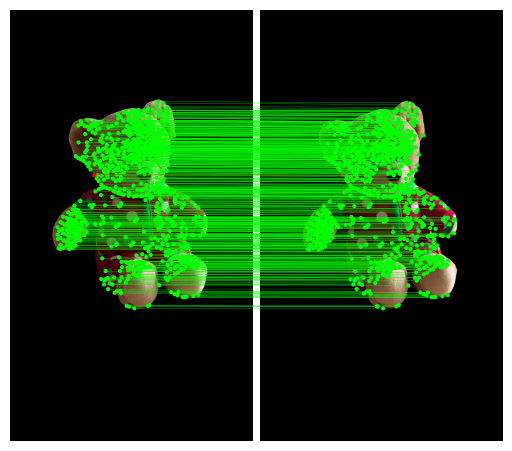

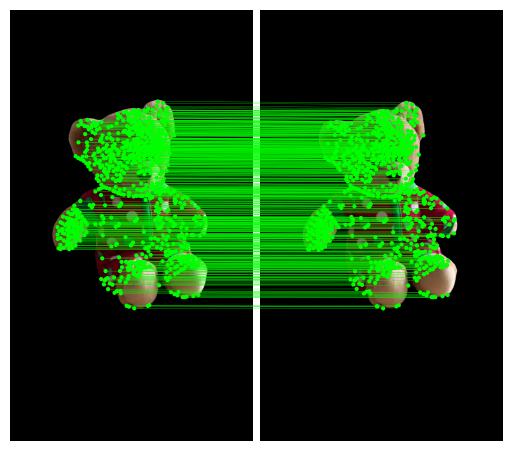

In [14]:
visualize(i, f, m)